# __BPIC19 Case Study:__ _DyLoPro: Profiling the Dynamics of Event Logs_

__NOTE__: This case study is performed with the __beta version__ of the  __DyLoPro__ library, which will soon be launched publically. 

This notebook contains the __extensive case study on the dynamics over time in the BPIC19 event log__. The BPIC19 event log can be downloaded [here](https://doi.org/10.4121/uuid:d06aff4b-79f0-45e6-8ec8-e19730c248f1). 

This notebook consists of __6 sections__, with each section corresponding to a certain event log conceptualization, for which it contains the most interesting identified trends, patterns or changes over time. In each section, the visualizations are accompanied with markdown cells discussing these distinctive dynamics over time. 

0. [__General Remarks and Observations__](#0-general-observations-and-remarks)
1. [__Variants__](#1-variants): The dynamics observed for the variants indicate significant and sudden changes in the control-flow perspective. 
1. [__Directly-Follows-Relations__](#2-directly-follows-relations-dfrs): The dynamics observed for the DFRs also indicate significant and sudden changes in the control-flow perspective.
1. [__Categorical Case Features__](#3-categorical-case-features): Interesting patterns and changes were observed for multiple categorical case features _(data perspective)_. 
1. [__Categorical Event Features__](#4-categorical-event-features): Interesting patterns and changes were observed for multiple categorical event features, including 'org:resource' _(resource perspective)_, 'Selected' & 'Accepted' _(both data perspective)_, and in 'concept:name', which contains the activity labels of the events _(control-flow perspective)_. 
1. [__Numerical Event Features__](#5-numerical-event-features): Only one numeric event feature is contained within the BPIC19 event log. Apart from outliers at the beginning and the end of the dataset, no prominant changes were detected. 

The BPIC19 event log contains no numerical case features. More information on the data can be found [here](https://icpmconference.org/2019/icpm-2019/contests-challenges/bpi-challenge-2019/).

Importing pandas and the __DyLoPro__ library. 

In [1]:
import pandas as pd
import DyLoPro as dlp

Reading in the event log and converting some columns to the required dtype. 

In [2]:
from preprocess_case_studies import preprocess_bpic19
path_to_bpic19 = "BPIC19.csv"
log = pd.read_csv(path_to_bpic19, header = 0)
log = preprocess_bpic19(log)

Specifying the available features. The BPIC 19 event log contains no case outcome and no numeric case featuers. 

In [3]:
categorical_casefeatures=[ 'case:Spend area text', 'case:Company', 'case:Document Type', 
                          'case:Sub spend area text', 'case:Purchasing Document', 
                           'case:Vendor', 'case:Item Type', 
                          'case:Item Category', 'case:Spend classification text', 
                          'case:GR-Based Inv. Verif.', 'case:Goods Receipt']
categorical_eventfeatures = ['org:resource', 'concept:name', 'User']
numeric_eventfeatures= ['Cumulative net worth (EUR)']

Initializing a __DynamicLogPlots__ instance as __bpic19_plots__. NOTE: As there are a few cases with erroneous timestamps (dating from 1948), we only want to analyze the trends for cases starting from 2018. 

In [4]:
bpic19_plots = dlp.DynamicLogPlots(log, case_id_key = 'case:concept:name', activity_key = 'concept:name', 
                                   timestamp_key = 'time:timestamp', categorical_casefeatures = categorical_casefeatures, 
                                   categorical_eventfeatures = categorical_eventfeatures, 
                                   numerical_eventfeatures = numeric_eventfeatures, start_date = "01/01/2018")

Preprocessing the data...


c:\Users\Brecht\anaconda3\envs\BPIC_2017\lib\site-packages\pandas\core\arrays\datetimes.py:1162: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  warnings.warn(
100%|██████████| 1587925/1587925 [00:00<00:00, 3523878.80it/s]
c:\Users\Brecht\anaconda3\envs\BPIC_2017\lib\site-packages\pandas\core\arrays\datetimes.py:1162: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  warnings.warn(
c:\Users\Brecht\anaconda3\envs\BPIC_2017\lib\site-packages\pandas\core\arrays\datetimes.py:1162: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  warnings.warn(
c:\Users\Brecht\anaconda3\envs\BPIC_2017\lib\site-packages\pandas\core\arrays\datetimes.py:1162: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  warnings.warn(


All of __DyLoPro__'s plotting methods construct time series by deriving real-valued measures for a choronologically ordered set of sublogs. This chronologically ordered set of sublogs is constructed by: 
1. Defining the `frequency` parameter, that determines the frequency by which the observations are grouped. E.g. here, for all visualizations, we use the default `frequency='weekly'`. As such, the time period covered by the entire event log is subdivided into a chronologically ordered set of weekly time intervals. 
1. Defining the `case_assignment` parameter, that determines the condition upon which each case is assigned to one of these equal-length time intervals. E.g. here, for all visualizations, we use the default `case_assignment='first_event'`. As such, each case is assigned to the time interval in which it first event occurs.

Consequently, for the BPIC19 case study with `frequency='weekly'` and `case_assignment='first_event'`, each case is assigned to the 1-week time interval in which its first event occurs and hence each sublog will consist of all cases that were initialized in one particular week. 

__NOTE__: For the BPIC19 plots, we use the default settings for the following common parameters unless specified otherwise:
- time_unit = 'days'
- frequency = 'weekly'
- case_assignment = 'first_event'
- numeric_agg = 'mean'
- max_k = 10
- xtr_outlier_rem = True

## __0. General observations and remarks__:

1. Every plotting method also provides a first global overview of the amount of cases contained within each interval, and: 
    - If __representation type = Throughput Time (TT)__ (`plt_type='type_tt'`): the overal throughput time aggregated over all cases contained within each time interval / sublog. _(The aggregation operator is by default the mean, and can be customized by specifying the `numeric_agg` parameter of each plotting method.)_
    - If __representation type = Case Length (Number of Events per Case, aka NEPC)__ (`plt_type='type_events_case'`): the overal case length (in NEPC) aggregated over all cases contained within each time interval / sublog. _(The aggregation operator is by default the mean, and can be customized by specifying the `numeric_agg` parameter of each plotting method.)_
    - If __representation type = Outcome__ (`plt_type='type_outcome'`): the overal fraction of positive cases contained within each time interval / sublog. _(No binary outcome feature is included in the BPIC19.)_
1. The default representation type of each plotting method is Isolated, but since each non-default representation type also includes the isolated time series, we only use the non-default representation tpyes.     

1. The BPIC19 event log contains cases pertaining to purchase orders submitted in 2018. Consequently, if we assume that only completed cases are extracted that roughly started after 2018-01-01 and ended before a certain extraction date, both the **beginning** and **ending** of the event log contain some **bias**:
    - **Bias** in **beginning** event log - By only including the cases that start after a certain point in time, the number of running cases in the beginning of the event log does not reflect the underlying actual reality. How long this bias is persisted in the plots depends on both the chosen __`frequency`__ (= `'weekly'` in the BPIC19 case study) and the distribution of the __throughput time__ of cases. 
    - **Bias** in **ending** of the event log - By only including the **completed** cases that end (and hence are completed) before a certain point in time:
        1. The number of running cases towards the end of the event log does not reflect the underlying actual reality. Again, the amount of subsequent time intervals located near the end of the event log in which this bias is included, depends on both the chosen __`frequency`__ (= `'weekly'` in the BPIC19 case study) and the distribution of the __throughput time__ of cases.
        1. The average throughput time (TT) of cases towards the end of the dataset is lower than the actual reality. Among cases starting near the ending, cases with a higher TT will be more likely to end after the extraction date and will hence not be included in the event log. The amount of time intervals near the end in which this bias is persisted will again also depend on the chosen __`frequency`__ (= `'weekly'` in the BPIC19 case study) and the distribution of the __throughput time__ of cases.

    Intervals near the beginning and end of the event log in which the number of cases is significantly smaller compared to other time intervals, might give us non-representative samples of cases, and hence yield unrepresentative aggregations. Every plotting method also provides a first global overview of the amount of cases contained within each interval. As such, unrepresentative samples near the beginning or end of the event log can easily be identified. Therefore, we will not report on deviating measurements if they pertain to such non-representative samples. 

1. __GENERAL TRENDS__: 
    - __Throughput Time (TT)__: In general, the _weekly mean TT_ of cases fluctuates around 80 days before *2018-09*, after which it starts declining and ultimately converges to 0 days towards the end of the event log. 
        - One __plausible hypothesis__ is based on the __2nd type of bias induced towards the end of the event log__. If only the cases that are completed before the extraction date are included, then the closer towards this extraction date, the shorter the TT of cases have to be in order to be still included. Because of the fact that the BPIC19 covers cases over only +- 1 year, and because the average throughput time initially fluctuates around 80 days, it would indeed be plausible that this bias already becomes clearly visible around *2018-09*, since cases corresponding to positive outliers in their throughput times will already not be included in the event log, and thereby already skewing the distribution of the weekly mean TT.
        - If this would be the case, the observed performance drift would not correspond to an actual drift in the underlying data generating function, but rather to the extraction bias induced towards the end of the event log. If other case characteristics are correlated to the throughput time of cases, then this bias might also induce skewness in other characteristics' distributions sampled towards the end of the event log.
        - This declining gradual drift in the weekly mean TT of cases can be observed in e.g. the upper left subplot of [this visualization](#21-representation-type--throughput-time-tt).
    - __Case Length (NEPC)__: In general, although less pronounced, also the _weekly mean Number of Events Per Case (NEPC)_ experiences a gradual decline towards the end of the event log. If a case's throughput time and NEPC would be correlated, then the same bias could be a plausible explanation for this trend. Thsi gradual drift can be observed in e.g. the upper left subplot of [this visualization](#22-representation-type--case-length-nepc).

## __1. Variants__
We investigate the dynamics over time for the top 10 most frequently occurring variants. The following interesting trends, patterns and changes were identified: 
1. Significant and sudden concept drift in the control-flow perspective around 2018-09:
    - __Variant 1__ originally delivered around 25-30% of the cases. Around 2018-09 it incurred a sudden and steep decline. 
    - Similar changes can be observed for __variants 2, 4, 5, 8 and 10__. 
    - __Variant 6__ on the other hand goes from being almost non-existent to being the main supplier at that exact same point in time. If we look a little bit closer at the differences between variant 6 and variant 1 (in the printed dataframe in the python cell below), it becomes apparant that variant 6 is almost identical to variant 1, except for the fact that it contains one additional activity as its starting activity: 'Create Purchase Requisition Item'. If we look at the plotted time series of the 10 most frequently occurring activities in section [__4.2__](#42-categorical-event-feature-conceptname), it is established that this sudden steep decline of __variant 1__ and the concurrent rise of __variant 6__ can be explained by the introduction of this new 'Create Purchase Requisition Item' starting activity. 
2. A gradual drift in the performance perspective (i.e. the throughput time of cases) (also) starting around 2018-09: 
    - Each plotting method always gives a global overview of the amount of cases belonging to each time period _(/in each sublog)_, as well as the global evolution of the throughput time of cases in case of `plt_type='type_tt'`. If we look at the evolution of the mean throughput time, we observe a gradual decline in the cases throughput time starting around this same point in time, 2018-09, converging to 0 towards the end of the event log. 
2. Interesting throughput time patterns for some variants: 
    - Cases belonging to __variants 3 and 9__ have a significantly shorter average throughput time compared to all other cases. When looking at their corresponding activity sequences, it is likely that this shorter TT is due to these variants only containing 2 activities. 
    - Before the change point of 2018-09, the pattern of the average throughput time of cases belonging to __variant 1__ being shorter than the average throughput time of all other cases remained relatively stable. This pattern however also broke down around 2018-09. 
    - ...

Retrieving the dataframe containing the activity sequences (and counts) of the top 10 most frequently occurring variants.

In [8]:
var_df = bpic19_plots.get_var_df(max_k = 10, counts = True)
print(var_df.to_string())

                                                                                                                                                            variant  variant count
variant number                                                                                                                                                                    
1                                                 (Create Purchase Order Item, Vendor creates invoice, Record Goods Receipt, Record Invoice Receipt, Clear Invoice)          50286
2                                                 (Create Purchase Order Item, Record Goods Receipt, Vendor creates invoice, Record Invoice Receipt, Clear Invoice)          30798
3                                                                                                                (Create Purchase Order Item, Record Goods Receipt)          12214
4                           (Create Purchase Order Item, Vendor creates invoice, Record Goods Receipt, Re

Representation type : __Throughput Time__ 

c:\Users\Brecht\anaconda3\envs\BPIC_2017\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)
c:\Users\Brecht\anaconda3\envs\BPIC_2017\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)
Computing additional weekly Throughput Time aggregations for each of the 10 most frequently occurring variants: 100%|██████████| 10/10 [00:00<00:00, 26.87it/s]


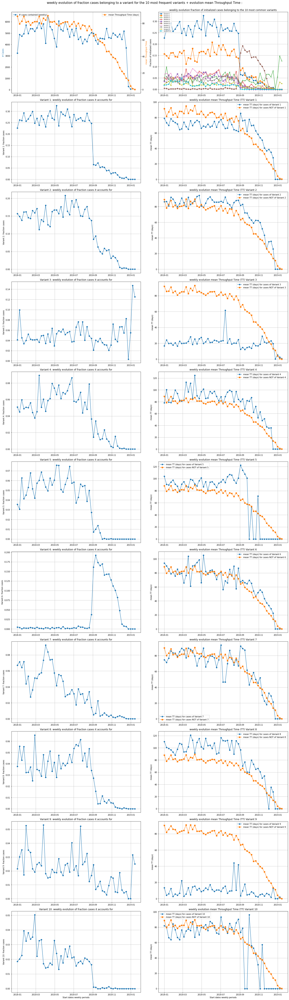

In [9]:
bpic19_plots.topK_variants_evol(max_k = 10, plt_type = 'type_tt', xtr_outlier_rem = False)

## __2. Directly-Follows-Relations (DFRs)__
We investigate the dynamics over time for the top 10 most frequently occurring DFRs. The following interesting trends, patterns and changes were identified: 
1. The changes in the control-flow perspective identified when examining the [__variants__](#1-variants) are also uncovered when examining the DFR dynamics. (These changes can be observed in all 3 subsections, since each `plt_type` option other than the `'univariate` also include the 'univariate' plots in the left panels.)
    - __DFR 2 and DFR 10__: Both the mean amount of occurrences per case and the fraction of cases with at least one occurrence of a certain DFR started to decline significantly around this exact same change point (2018-09). 
    - Other DFRs' mean amount of occurrences per case and fraction of cases exhibit remarkable patterns further towards the end of the dataset, but these can also be due to the fact that typically less cases are observed in the beginning and the end of the event log when extracting only completed cases. 
1. __DFR 1 and 9__ in general displays similar remarkable patterns. 
    1. Mean occurrences per case vs. fraction of cases with at least one occurrence: the mean amount of occurences per case is orders of magnitude greater than the fraction of cases that contain at least one occurrence of DFR 1 or 9.
    1. [Mean throughput time cases with at least one occurrence vs. mean throughput time all other cases](#21-representation-type--throughput-time-tt): The mean throughput time of cases containing at least one occurrence of DFR 1 is significantly smaller than than the mean TT of cases that do not. The mean TT of cases containing at least one occurrence of DFR 9 also seems to be smaller than the mean TT of cases that do not, but this difference is (far) less pronounced. 
    1. [Mean case length (NEPC) cases with at least one occurrence vs. mean NEPC all other cases](#22-representation-type--case-length-nepc): The mean number of events per case (NEPC) of cases containing __DFRs 1 or 9__ is drastically larger than the mean NEPC of cases that do not. This pattern remains stable over time for both DFRs. However, for both DFRs, the mean amount of occurences per case is orders of magnitude greater than the fraction of cases that contain at least one occurrence of DFR 1 or 9. On top of that, if we look at their corresponding activity pair (printed DFR table in python cell below) it becomes apparant that both __DFR 1 and DFR 9__ consist of a repition of one activity, *'Record Service Entry Sheet'* and *'Record Goods Receipt'* respectively. These observations, combined with the observation in the first bullet point, indicate that these activities, if they occur, are repeated numerous times for the same case. However, this does not seem to negatively influence the throughput time of these cases. __This might suggest that we are dealing with data entry errors, and that the immediate repitition of these activities might not correspond to actual rework.__
    1. [Mean DFR performance cases with at least one occurrence](#23-representation-type--dfr-performance): Furthermore, also the mean DFR performance of both DFRs is significantly lower than the mean performance of the other eight most frequently occurring DFRs. 
1. [Mean throughput time cases with at least one occurrence vs. mean throughput time all other cases](#21-representation-type--throughput-time-tt):
    1. Cases containing (at least one occurrence of) __DFRs 6, 7 or 10__ exhibit a significantly higher mean throughput time than cases who do not. This pattern remained relatively stable over time, until the same change point (2018-09). 
    1. Cases containing __DFR 1__ exhibit a significantly smaller throughput time than cases that don't. See supra. 
1. [Mean case length (NEPC) cases with at least one occurrence vs. mean NEPC all other cases](#22-representation-type--case-length-nepc):
    1. The mean number of events per case (NEPC) of cases containing __DFRs 1 or 9__ is drastically larger than the mean NEPC of cases that do not. *(See supra)*
    1. For some of the other most frequently occurring DFRs *(e.g. DFR 3, 4, 5)*, the mean weekly NEPC for cases containing those DFRs is initially significantly lower compared to other cases. However, also these patterns seem to break down around that same change point. 
1. [Mean DFR performance cases with at least one occurrence](#23-representation-type--dfr-performance): 
    1. We clearly observe a declining trend in the DFR performances of __DFRs 2 and 10__. These trends both seem to start around 2018-09. However, both for __DFRs 2 and 10__, the fraction of cases containing at least one occurrence also starts declining around this same point in time. 
    1. The mean DFR performance of __DFR 1__ is significantly lower compared to the other most frequently occurring DFRs. Around 2018-05, one outlier can be observed. 
    1. The mean DFR performance of __DFR 9__ is also lower compared to the other most frequently occurring DFRs. Just before the ubiquitous change point of 2019-09, one significant peak in the mean DFR performance can be observed. 
1. A gradual drift in the performance perspective (i.e. the throughput time of cases) (also) starting around 2018-09: 
    - Each plotting method always gives a global overview of the amount of cases belonging to each time period _(/in each sublog)_, as well as the global evolution of the throughput time of cases in case of `plt_type='type_tt'`. If we look at the evolution of the mean throughput time, we observe a gradual decline in the cases throughput time starting around this same point in time, 2018-09, converging to 0 towards the end of the event log. 

Retrieving the dataframe containing the activity pairs (and counts) of the top 10 most frequently occurring DFRs.

In [10]:
dfr_df = bpic19_plots.get_DFR_df(max_k = 10, counts = True)
print(dfr_df.to_string())

                                                                 DFR  DFR count
DFR number                                                                     
1           (Record Service Entry Sheet, Record Service Entry Sheet)     138997
2                            (Record Invoice Receipt, Clear Invoice)     134503
3                     (Record Goods Receipt, Record Invoice Receipt)     111970
4                     (Vendor creates invoice, Record Goods Receipt)     109984
5               (Create Purchase Order Item, Vendor creates invoice)     103129
6                   (Vendor creates invoice, Record Invoice Receipt)      95055
7                     (Record Goods Receipt, Vendor creates invoice)      80604
8                 (Create Purchase Order Item, Record Goods Receipt)      77028
9                       (Record Goods Receipt, Record Goods Receipt)      54178
10                             (Remove Payment Block, Clear Invoice)      49399


#### 2.1 Representation type : __Throughput Time (TT)__ 

Computing additional weekly Throughput Time aggregations for each of the 10 most frequently occurring DFRs: 100%|██████████| 10/10 [00:00<00:00, 11.72it/s]


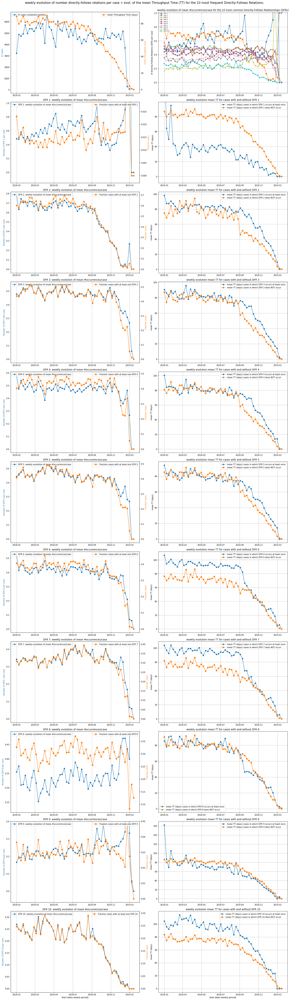

In [11]:
bpic19_plots.topK_dfr_evol(plt_type = 'type_tt')

#### 2.2 Representation type : __Case Length (NEPC)__ 

Computing additional weekly aggregations of the amount of events per case for each of the 10 most frequently occurring DFRs: 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]


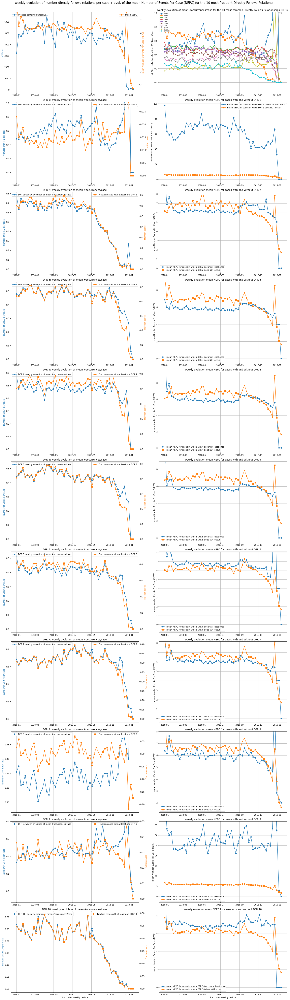

In [12]:
bpic19_plots.topK_dfr_evol(plt_type = 'type_events_case')

#### 2.3 Representation type : __DFR Performance__ 

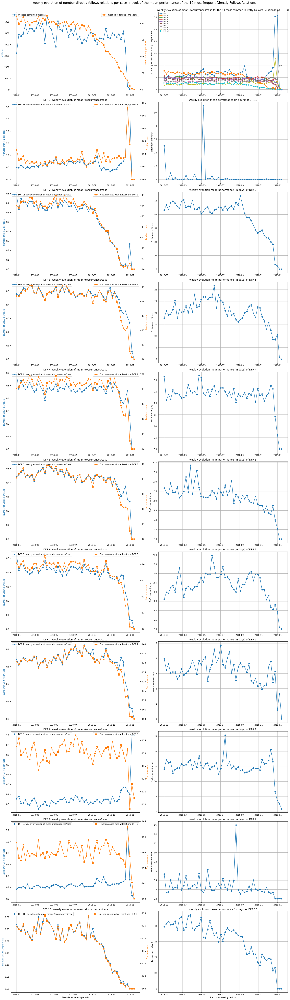

In [13]:
bpic19_plots.topK_dfr_evol(plt_type = 'type_dfr_performance', xtr_outlier_rem = False)

## __3. Categorical Case Features__ 
Only the categorical case features for which interesting trends / changes and patterns over time were identified are discussed here. For each categorical case feature, the evolutions pertaining to the most frequently occurring level are plotted first, those pertaining to the second most occurring level are plotted secondly, and so on. 

In [14]:
categorical_casefeatures

['case:Spend area text',
 'case:Company',
 'case:Document Type',
 'case:Sub spend area text',
 'case:Purchasing Document',
 'case:Vendor',
 'case:Item Type',
 'case:Item Category',
 'case:Spend classification text',
 'case:GR-Based Inv. Verif.',
 'case:Goods Receipt']

### __3.1 Categorical Case Features: 'case:Spend area text'__
Categorical case feature __'case:Spend area text'__ has 21 distinct levels. We investigate the dynamics over time for the top 10 most frequently occurring levels of __'case:Spend are text'__. The following interesting trends, patterns and changes were identified: 
1. [__Mean Throughput Time (TT) cases pertaining to a certain level vs. mean TT all other cases__](#311-casespend-area-text---representation-type-throughput-time-tt): 
    - __Higher mean TT__: Before *2018-09*, the mean TT of cases pertaining to the most frequently occurring level **'Packaging'** is (almost) consistently and significantly higher compared to the mean TT of cases pertaining to other levels. 
    - __Lower mean TT__: 
        - Before *2018-09*, the mean TT of cases pertaining to the **2nd** most frequently occurring level **'Sales'** is (almost) consistently and significantly lower compared to the mean TT of cases pertaining to other levels. 
        - The mean TT of cases pertaining to the **5th** most frequently occurring level **'CAPEX & SOCS'** is (almost) consistently lower compared to the mean TT of cases pertaining to other levels. A significant decline in the mean TT of cases pertaining to **'CAPEX & SOCS'** can be observed around *2018-07*.
        - The mean TT of cases pertaining to the **6th** most frequently occurring level **'Logistics'** is (almost) consistently and significantly lower compared to the mean TT of cases pertaining to other levels.
1. [__Mean Case Length (in number of events per case, aka NEPC) cases pertaining to a certain level vs. mean NEPC all other cases__](#312-casespend-area-text---representation-type-case-length-nepc): 
    - __Higher mean NEPC__: The mean NEPC of cases pertaining to the **6th** most frequently occurring level **'Logistics'** is consistently and orders of magnitude higher compared to the mean NEPC of cases pertaining to other levels. This might be counter-intuitive when taking into account the observations of **'Logistics'**-cases having a lower mean TT.
    - __Lower mean NEPC__: 
        - **Most** frequently occurring level **'Packaging'**: in contrast to the mean TT, the mean NEPC of cases pertaining to the level **'Packaging'** is consistently lower compared to the mean NEPC of cases pertaining to other levels. 
        - **2nd** most frequently occurring level **'Sales'**: similar to the mean TT, the mean NEPC of cases pertaining to the level **'Sales'** is consistently lower compared to the mean NEPC of cases pertaining to other levels.
        - **4th** most frequently occurring level **'Additives'**: the mean NEPC of cases pertaining to the level **'Sales'** is consistently lower compared to the mean NEPC of cases pertaining to other levels.
1. __Fraction of cases pertaining to each level:__ The 3 most occurring levels of *'case:Spend area text'*, i.e. **'Packaging'** *(1st)* **'Sales'** *(2nd)* and **'Trading & End Products'** *(3rd)* are *(almost)* consistently responsible for over 80% of all cases. 

#### __3.1.1 'case:Spend area text'__ - Representation type: __Throughput Time (TT)__

Computing additional weekly aggregations of the Throughput Time for each of the 10 most frequently occurring levels: 100%|██████████| 10/10 [00:00<00:00, 12.85it/s]


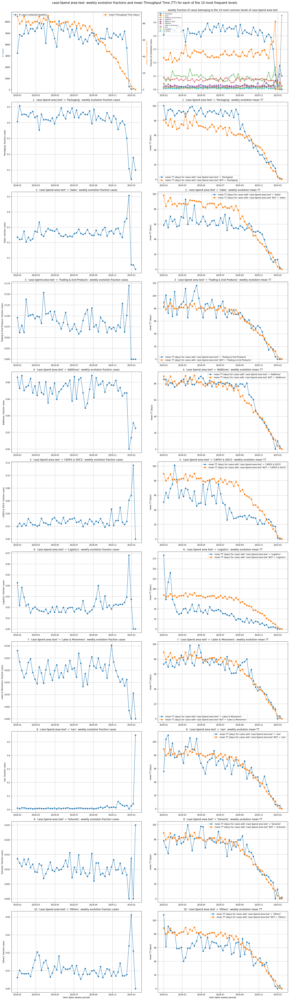

In [15]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Spend area text', plt_type = 'type_tt', xtr_outlier_rem = False)

#### __3.1.2 'case:Spend area text'__ - Representation type: __Case Length (NEPC)__

Computing additional weekly aggregations of the Number of Events Per Case (NEPC) for each of the 10 most frequently occurring levels: 100%|██████████| 10/10 [00:00<00:00, 11.63it/s]


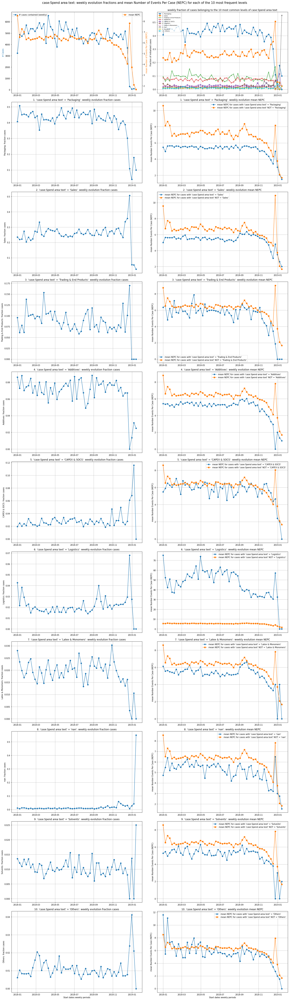

In [16]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Spend area text', plt_type = 'type_events_case', xtr_outlier_rem = False)

### __3.2 Categorical Case Features: 'case:Sub spend area text'__
Categorical case feature __'case:Sub spend area text'__ has 136 distinct levels. We investigate the dynamics over time for the top 10 most frequently occurring levels of __'case:Sub spend area text'__. The following interesting trends, patterns and changes were identified: 
1. [__Mean Throughput Time (TT) cases pertaining to a certain level vs. mean TT all other cases__](#321-casesub-spend-area-text---representation-type-throughput-time-tt): 
    - __Higher mean TT__: 
        - **2nd** most frequently occurring level **'Labels'**: Before *2018-09*, the mean TT of cases pertaining to the level **'Labels'** is consistently and significantly higher compared to the mean TT of cases pertaining to other levels. 
        - **7th** most frequently occurring level **'Packaging-Other'**: Before *2018-09*, the mean TT of cases pertaining to the level **'Packaging-Other'** is (almost) consistently higher compared to the mean TT of cases pertaining to other levels. 
    - __Lower mean TT__: 
        - **Most** frequently occurring level **'Products for Resale'**: Before *2018-09*, the mean TT of cases pertaining to the level **'Products for Resale'** is consistently and significantly lower compared to the mean TT of cases pertaining to other levels. 
        - **8th** most frequently occurring level **'Road Packed'**: the mean TT of cases pertaining to the level **'Road Packed'** is (almost) consistently and significantly lower compared to the mean TT of cases pertaining to other levels.
        - **10th** most frequently occurring level **'MRO (components)'**: Before *2018-09*, the mean TT of cases pertaining to the level **'MRO (components)'** is consistently and significantly lower compared to the mean TT of cases pertaining to other levels. After *2018-09*, also this pattern starts to break down. 
1. [__Mean Case Length (in number of events per case, aka NEPC) cases pertaining to a certain level vs. mean NEPC all other cases__](#322-casesub-spend-area-text---representation-type-case-length-nepc): 
    - __Higher mean NEPC__: The mean NEPC of cases pertaining to the **8th** most frequently occurring level **'Road Packed'** is consistently and orders of magnitude higher compared to the mean NEPC of cases pertaining to other levels. This might be counter-intuitive when taking into account the observations of **'Road Packed'**-cases having a lower mean TT.
    - __Lower mean NEPC__: 
        - **Most** frequently occurring level **'Products for Resale'**: similar to the mean TT, the mean NEPC of cases pertaining to the level **'Products for Resale'** is consistently lower compared to the mean NEPC of cases pertaining to other levels. This pattern seems to level out starting from *2018-09*. 
        - **2nd** most frequently occurring level **'Labels'**: in contrast to the mean TT, the mean NEPC of cases pertaining to the level **'Labels'** is consistently lower compared to the mean NEPC of cases pertaining to other levels.
        - Similar NEPC patterns can be observed for other levels. 
1. __Fraction of cases pertaining to each level:__ The 4 most occurring levels of *'case:Sub spend area text'*, i.e. **'Products for Resale'** *(1st)* **'Labels'** *(2nd)*,**'Trading products (old structure)'** *(3rd)* and **'Metal Containers & Lids < 30L'** *(4th)* are *(almost)* consistently responsible for over 60% of all cases. 

#### __3.2.1 'case:Sub spend area text'__ - Representation type: __Throughput Time (TT)__

Computing additional weekly aggregations of the Throughput Time for each of the 10 most frequently occurring levels: 100%|██████████| 10/10 [00:00<00:00, 14.03it/s]


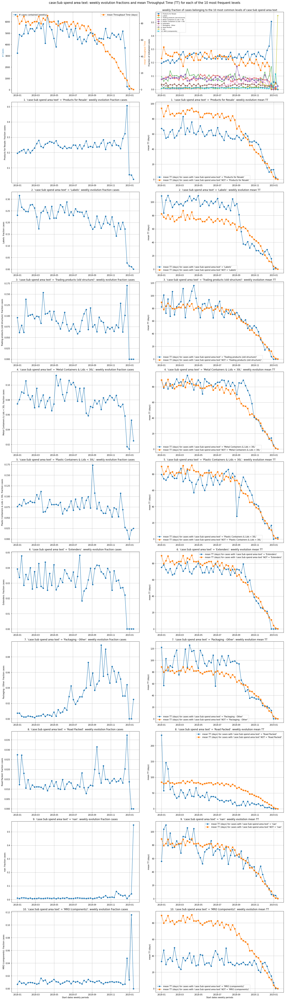

In [17]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Sub spend area text', plt_type = 'type_tt', xtr_outlier_rem = False)

#### __3.2.2 'case:Sub spend area text'__ - Representation type: __Case Length (NEPC)__

Computing additional weekly aggregations of the Number of Events Per Case (NEPC) for each of the 10 most frequently occurring levels: 100%|██████████| 10/10 [00:00<00:00, 13.67it/s]


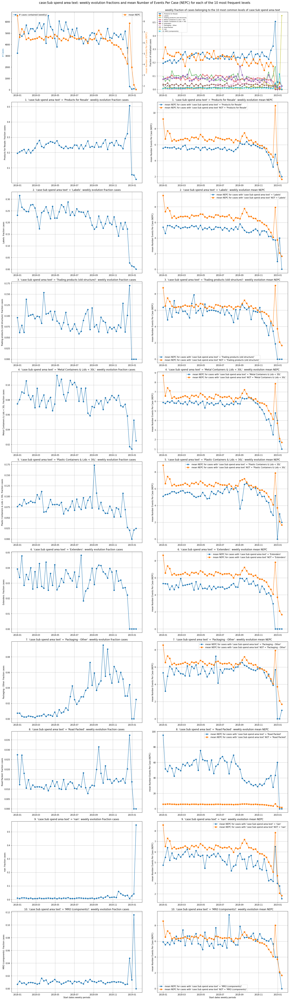

In [18]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Sub spend area text', plt_type = 'type_events_case', xtr_outlier_rem = False)

### __3.3 Categorical Case Features: 'case:Vendor'__
Categorical case feature __'case:Vendor'__ has 1,975 distinct levels. We investigate the dynamics over time for the top 10 most frequently occurring levels of __'case:Vendor'__. In general, trends, patterns and changes similar to the ones observed for the categorical case features [__'case:Spend area text'__](#31-categorical-case-features-casespend-area-text) and [__'case:Sub spend area text'__](#32-categorical-case-features-casesub-spend-area-text), with some patterns again breaking down around *2018-09*. Because of the fact that __'case:Vendor'__ is such a high-level categorical, and because even its 10 most frequently occurring levels only account for a relatively small fraction of the cases, we will not discuss these plots in further detail. 

#### __3.3.1 'case:Vendor'__ - Representation type: __Throughput Time (TT)__

Computing additional weekly aggregations of the Throughput Time for each of the 10 most frequently occurring levels: 100%|██████████| 10/10 [00:01<00:00,  5.58it/s]


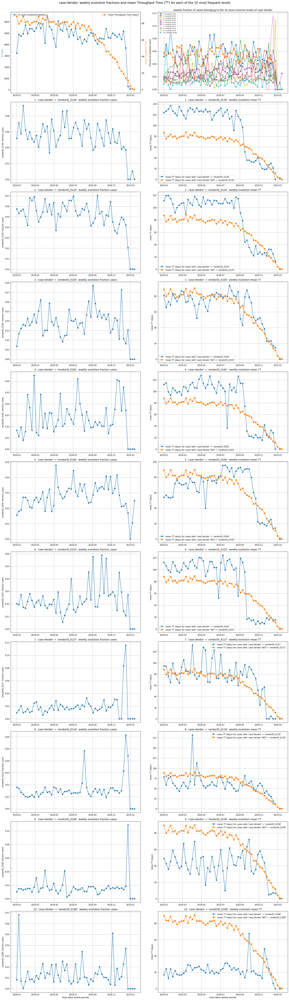

In [19]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Vendor', plt_type = 'type_tt', xtr_outlier_rem = False)

#### __3.3.2 'case:Vendor'__ - Representation type: __Case Length (NEPC)__

Computing additional weekly aggregations of the Number of Events Per Case (NEPC) for each of the 10 most frequently occurring levels: 100%|██████████| 10/10 [00:01<00:00,  5.66it/s]


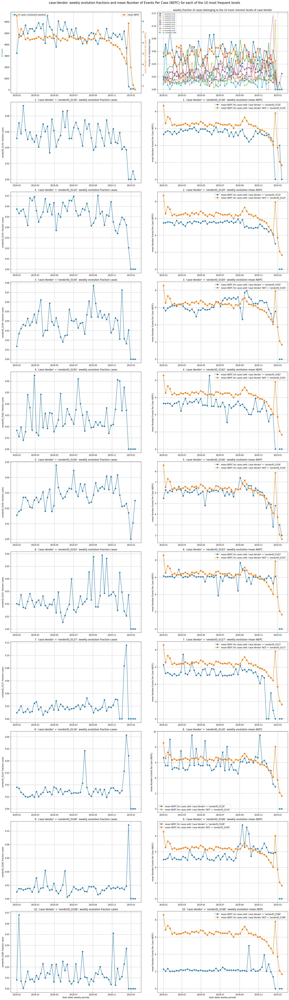

In [20]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Vendor', plt_type = 'type_events_case', xtr_outlier_rem = False)

### __3.4 Categorical Case Features: 'case:Item Category'__
Categorical case feature __'case:Item Category'__ has only 4 distinct levels. We investigate the dynamics over time for each of the 4 __'case:Item Category'__ levels. The following interesting trends, patterns and changes were identified: 
1. __Fraction of cases pertaining to each level:__ 
    - __'3-way match, invoice before GR'__: 
        - (Almost) consistently and by far the **most** occurring level.
        - Accounting for +- 85-90% of the cases (except for the last 3 weeks).
    - __'3-way match, invoice after GR'__: 
        - **2nd** most occurring level.
        - Fluctuating around the range of +- 5-8% of the cases (except for the last 3 weeks).
    - __'Consignment'__: 
        - **3rd** most occurring level.
        - More volatile time series, mostly fluctuating between +- 4-8% of the cases (except for the last 4 weeks). 
    - __'2-way match'__:
        - **Least** occurring level. 
        - Goes from being almost non-existent, to being the main supplier of cases in the last 3 weeks. Hence, curing the last 3 weeks, __'2-way match'__ mostly replaces the other 3 levels of **'case:Item Category'**. 
1. [__Mean Throughput Time (TT) cases pertaining to a certain level vs. mean TT all other cases__](#341-caseitem-category---representation-type-throughput-time-tt): 
    - __'3-way match, invoice before GR'__: The weekly mean TT of the *(+-90% of)* cases pertaining to the level __'3-way match, invoice before GR'__ is consistently and significantly **higher** compared to the weekly mean TT of the *(+-10% of)* cases pertaining to one of the other 3 levels. This relatively stable difference also converges towards 0 from *2018-09*.
    - __'3-way match, invoice after GR'__: no significant difference observed in the weekly mean TT of cases pertaining to this level compared ot cases pertaining to other levels. Hence, given the fact that the level *'3-way match, invoice __before__ GR'* delivers the vast majority of cases, no significant difference in the mean TT between cases pertaining to this level *('3-way match, invoice __after__ GR')* and cases pertaining to the most occurring level *('3-way match, invoice __before__ GR')* is observed. 
    - __'Consignment'__: Weekly mean TT of cases pertaining to this level is consistently and highly significantly **lower** compared to the mean TT of cases pertaining to other levels. This pattern / difference once again starts to converge after *2018-09*. 
    - __'2-way match'__: As already mentioned, except for the last 3-4 weeks, this level is almost non-existent. As such, the amount of cases and associated throughput times to be averaged over on a weekly basis is very low, delivering a non-representative and highly volatile time series. 
1. [__Mean Case Length (in number of events per case, aka NEPC) cases pertaining to a certain level vs. mean NEPC all other cases__](#342-caseitem-category---representation-type-case-length-nepc): 
    - __'3-way match, invoice before GR'__: in contrast to its mean TT, the mean weekly NEPC of cases pertaining to this level is consistently and significantly **lower** compared to the mean NEPC of cases pertaining to other levels. 
    - __'3-way match, invoice after GR'__: The mean weekly NEPC of cases pertaining to the **2nd** most occurring level of *'case:Item Category'* is consistently and significantly **higher** compared to the mean NEPC of cases pertaining to one of the other 3 levels.
    - __'Consignment'__: Similar to its throughput time, the weekly mean NEPC of cases pertaining to this level is consistently and highly significantly **lower** compared to the mean NEPC of cases pertaining to other levels.
    - __'2-way match'__: As already mentioned, except for the last 3-4 weeks, this level is almost non-existent. As such, the amount of cases and associated number of events per case (NEPC) to be averaged over on a weekly basis is very low, delivering a non-representative and highly volatile time series. 

#### __3.4.1 'case:Item Category'__ - Representation type: __Throughput Time (TT)__

Computing additional weekly aggregations of the Throughput Time for each of the 4 most frequently occurring levels: 100%|██████████| 4/4 [00:00<00:00,  6.79it/s]


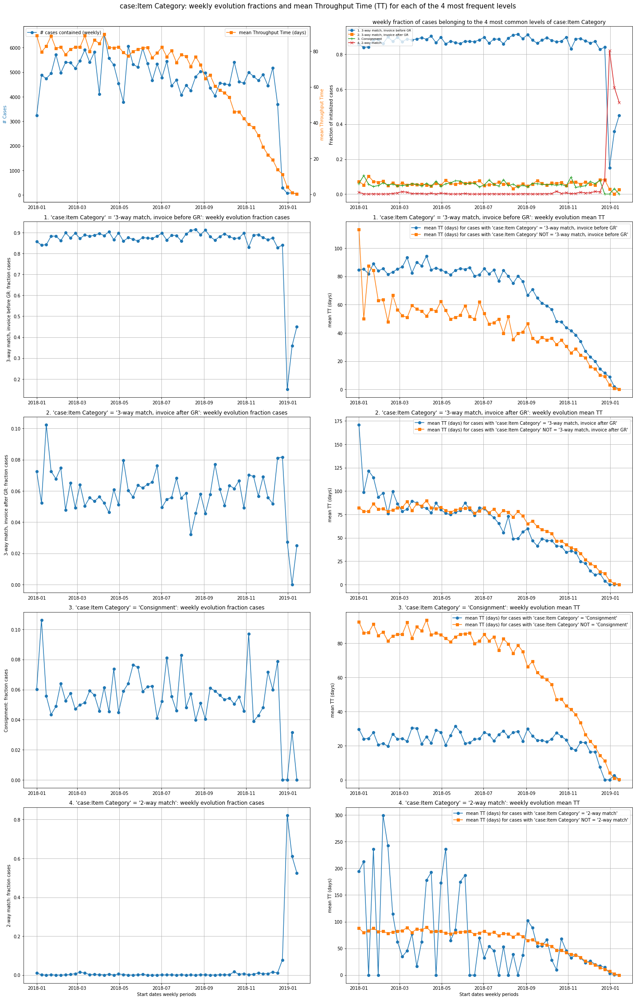

In [21]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Item Category', plt_type = 'type_tt', xtr_outlier_rem = False)

#### __3.4.2 'case:Item Category'__ - Representation type: __Case Length (NEPC)__

Computing additional weekly aggregations of the Number of Events Per Case (NEPC) for each of the 4 most frequently occurring levels: 100%|██████████| 4/4 [00:00<00:00,  8.23it/s]


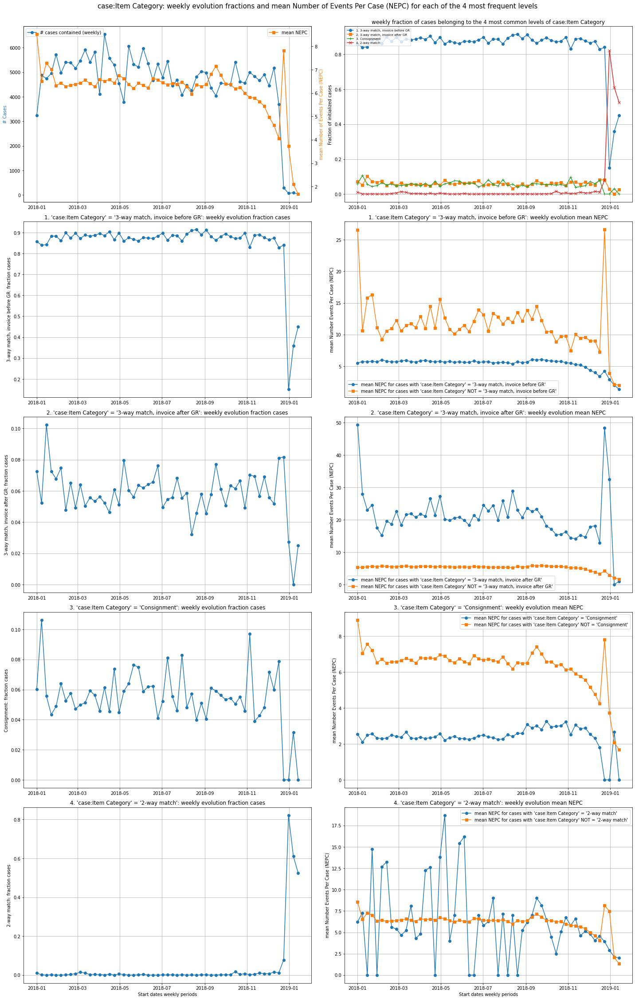

In [22]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Item Category', plt_type = 'type_events_case', xtr_outlier_rem = False)

### __3.5 Categorical Case Features: 'case:Spend classification text'__
Categorical case feature __'case:Spend classification text'__ has only 4 distinct levels. We investigate the dynamics over time for each of the 4 __'case:Spend classification text'__ levels. The following interesting trends, patterns and changes were identified: 
1. __Fraction of cases pertaining to each level:__ 
    - __'PR'__: 
        - (Almost) consistently the **most** occurring level.
        - Accounting for +- 60-70% of the cases (except for the last 4 weeks).
    - __'NPR'__: 
        - **2nd** most occurring level.
        - Fluctuating around the range of +- 30-35% of the cases (except for the last 5-6 weeks). In the last weeks, __'NPR'__ replaces __'PR'__ as the main supplier of cases. 
    - __'nan'__: 
        - **3rd** most occurring level.
        - Almost non-existent, except for the final week, in which it delivers 50% of the cases. However, if we look at the first global plots, there are almost no cases contained in this final time interval / sublog. 
    - __'OTHER'__:
        - **Least** occurring level. 
        - Almost non-existent. 
    
    __Bottom line__: The 2 least occurring levels (*'nan'* and *'OTHER'*) are almost non-existent, while the 2 most occurring levels are consistently responsible for more than 95% of the cases. Therefore, when examining the [__Throughput Time (TT)__](#351-casespend-classification-text---representation-type-throughput-time-tt) and the [__Case Length (NEPC)__](#352-casespend-classification-text---representation-type-case-length-nepc) representation types, these 2 least occurring levels will not be discussed. 
    
1. [__Mean Throughput Time (TT) cases pertaining to a certain level vs. mean TT all other cases__](#351-casespend-classification-text---representation-type-throughput-time-tt): 
    - __'PR'__: Before *2018-09*, the weekly mean TT of the cases pertaining to this level is almost consistently **higher** compared to the mean TT of cases pertaining to other levels (predominantly to the __'NPR'__ level). Once again, this pattern starts to break down from *2018-09* onwards. 
    - __'NPR'__: Before *2018-09*, the weekly mean TT of the cases pertaining to this level is almost consistently **lower** compared to the mean TT of cases pertaining to other levels (predominantly to the __'PR'__ level). Once again, this pattern starts to break down from *2018-09* onwards.
1. [__Mean Case Length (in number of events per case, aka NEPC) cases pertaining to a certain level vs. mean NEPC all other cases__](#352-casespend-classification-text---representation-type-case-length-nepc): Compared to the weekly mean TT of cases pertaining to the **'PR'** and **'NPR'** levels respectively, an opposite pattern can be observed when examining the (weekly) mean case length (NEPC) of both levels. 

#### __3.5.1 'case:Spend classification text'__ - Representation type: __Throughput Time (TT)__

Computing additional weekly aggregations of the Throughput Time for each of the 4 most frequently occurring levels: 100%|██████████| 4/4 [00:00<00:00,  7.12it/s]


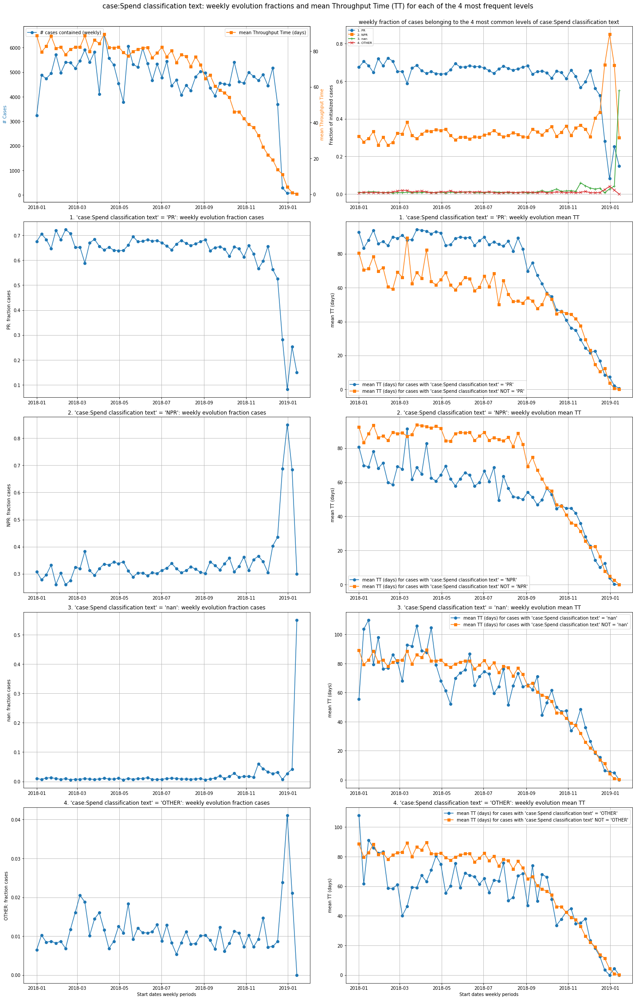

In [23]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Spend classification text', plt_type = 'type_tt', xtr_outlier_rem = False)

#### __3.5.2 'case:Spend classification text'__ - Representation type: __Case Length (NEPC)__

Computing additional weekly aggregations of the Number of Events Per Case (NEPC) for each of the 4 most frequently occurring levels: 100%|██████████| 4/4 [00:00<00:00, 15.31it/s]


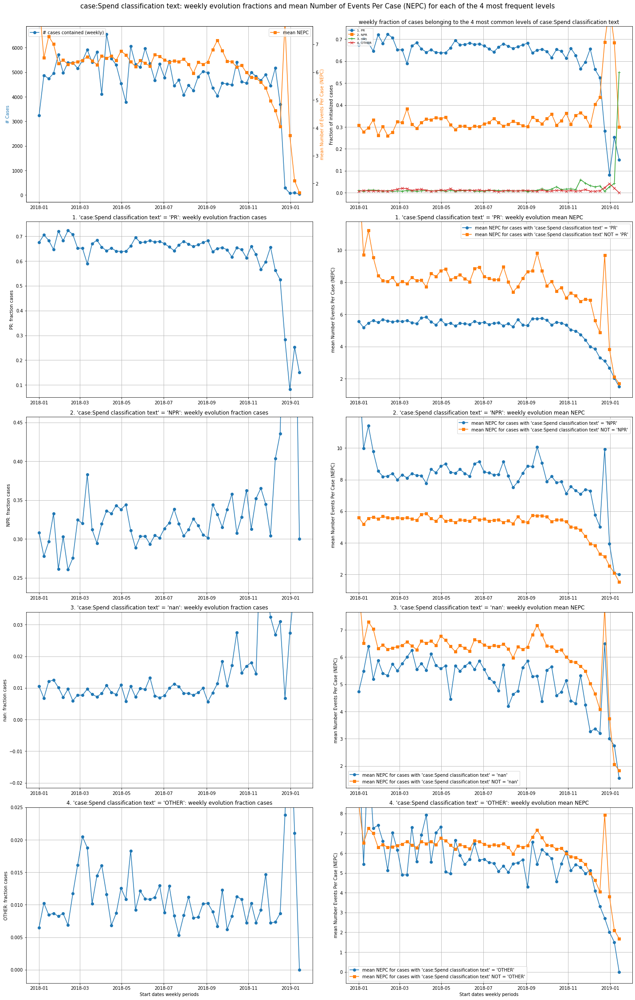

In [24]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:Spend classification text', plt_type = 'type_events_case')

### __3.6 Categorical Case Features: 'case:GR-Based Inv. Verif.'__
Categorical case feature __'case:GR-Based Inv. Verif.'__ is a boolean case feature, consisting of only the levels `True` and `False`. For the majority of cases, this feature takes on the value __'True'__, which delivers between 92-96% of the cases on a weekly basis. While there is no apparant difference in the [mean weekly TT](#361-casegr-based-inv-verif---representation-type-throughput-time-tt) of cases with `case:GR-Based Inv. Verif.=True` vs. cases with `case:GR-Based Inv. Verif.=False`, a significant difference in the [mean weekly case length](#362-casegr-based-inv-verif---representation-type-case-length-nepc) can be observed. 

#### __3.6.1 'case:GR-Based Inv. Verif.'__ - Representation type: __Throughput Time (TT)__

Computing additional weekly aggregations of the Throughput Time for each of the 2 most frequently occurring levels: 100%|██████████| 2/2 [00:00<00:00, 20.49it/s]


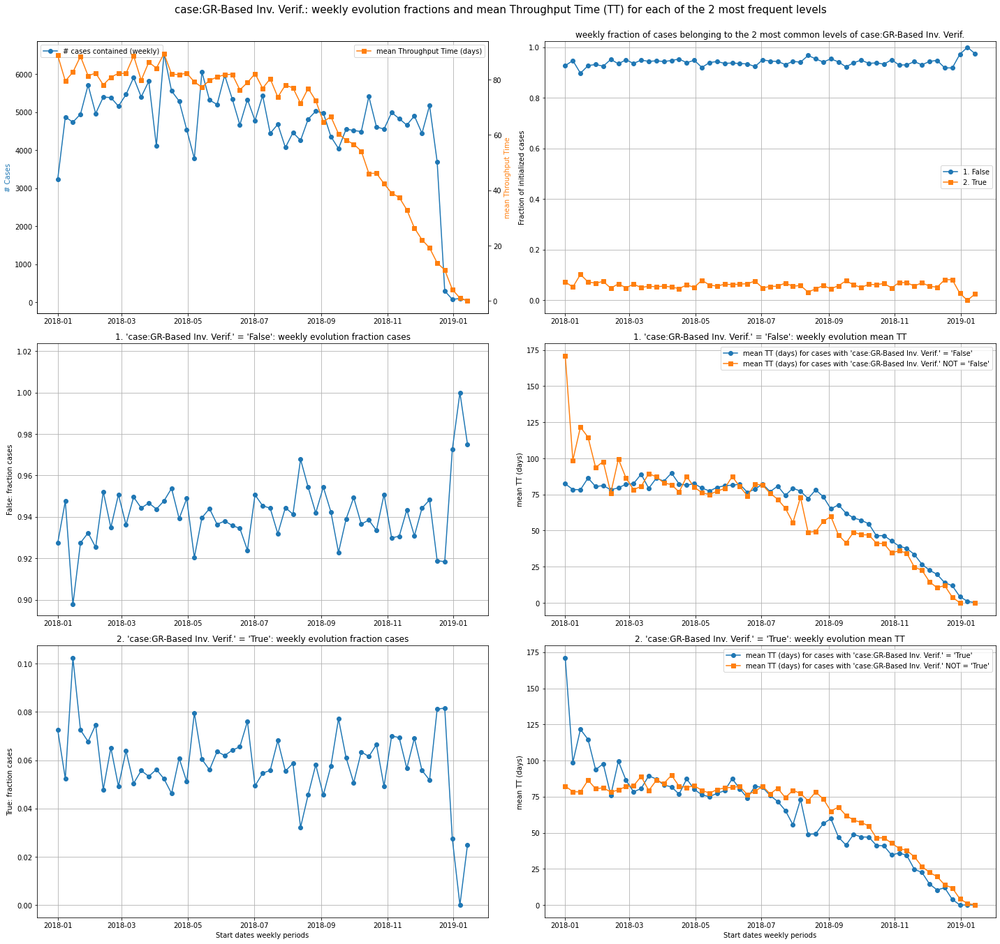

In [25]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:GR-Based Inv. Verif.', plt_type = 'type_tt')

#### __3.6.2 'case:GR-Based Inv. Verif.'__ - Representation type: __Case Length (NEPC)__

Computing additional weekly aggregations of the Number of Events Per Case (NEPC) for each of the 2 most frequently occurring levels: 100%|██████████| 2/2 [00:00<00:00, 21.40it/s]


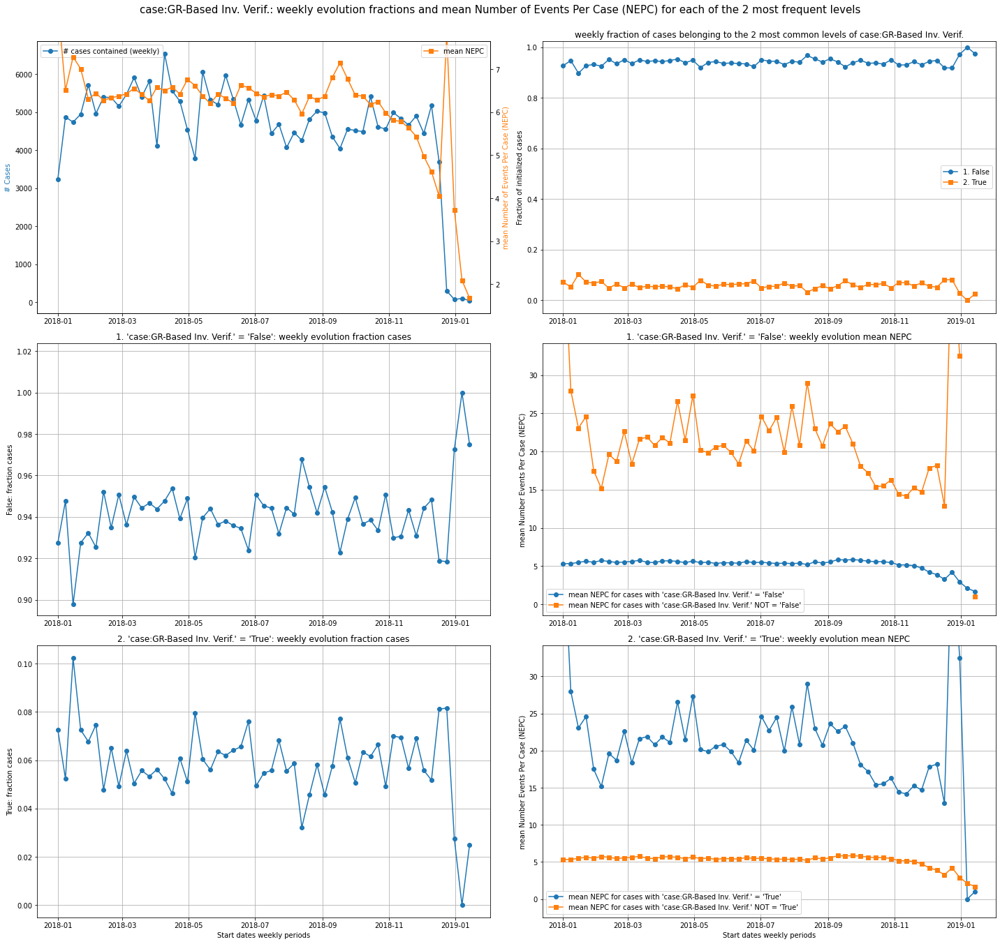

In [26]:
bpic19_plots.topK_categorical_caseftr_evol(case_feature = 'case:GR-Based Inv. Verif.', plt_type = 'type_events_case')

## __4. Categorical Event Features__ 

### __4.1. Categorical Event Feature: 'org:resource'__
**'org:resource'** refers to the column containing information about the resource that executes a certain event. The BPIC19 event log contains 628 distinct resources. In this subsection, we investigate the dynamics for the 10 most frequently occurring resources over time. NOTE: the event log contains another categorical event feature called **'User'**, but this column contains exactly the same information as the **'org:resource'** column. 

Overall, not that many interesting trends and patterns can be observed. Therefore, we do not elaborate further on this. 

#### __4.1.1 'org:resource'__ - Representation type: __Throughput Time (TT)__

Computing the weekly aggregations for each of the 10 most frequently occurring levels of categorical event feature 'org:resource': 100%|██████████| 10/10 [00:01<00:00,  5.37it/s]


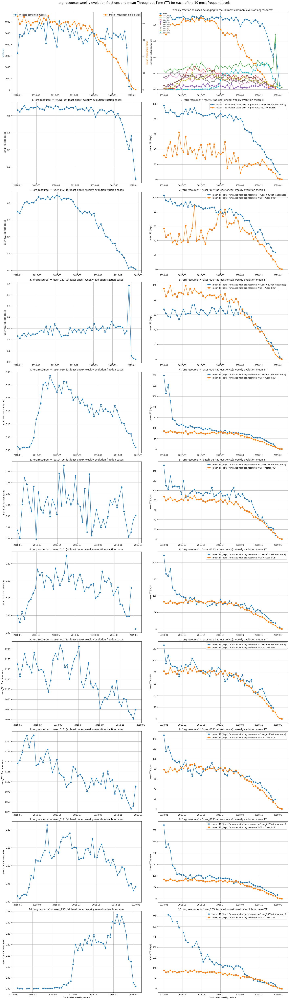

In [30]:
bpic19_plots.topK_categorical_eventftr_evol(event_feature='org:resource', plt_type = 'type_tt', xtr_outlier_rem = False)

#### __4.1.2 'org:resource'__ - Representation type: __Case Length (NEPC)__

Computing the weekly aggregations for each of the 10 most frequently occurring levels of categorical event feature 'org:resource': 100%|██████████| 10/10 [00:02<00:00,  4.68it/s]


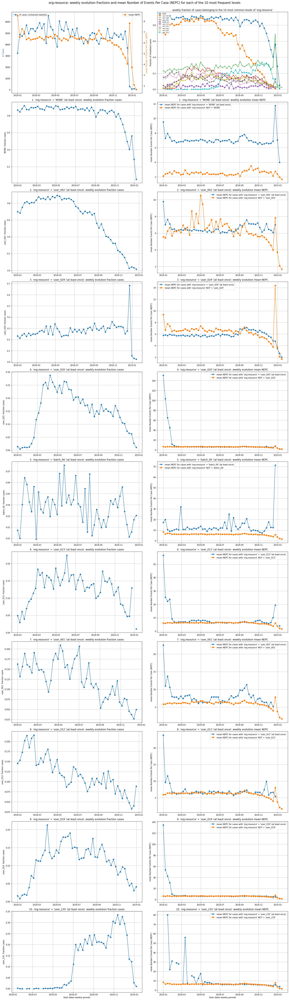

In [31]:
bpic19_plots.topK_categorical_eventftr_evol(event_feature='org:resource', plt_type = 'type_events_case', xtr_outlier_rem = False)

### __4.2. Categorical Event Feature: 'concept:name'__
**'concept:name'** refers to the column containing the __activity labels__ of each event. The BPIC19 event log contains 42 distinct activities. In this subsection, we investigate the dynamics for the 10 most frequently occurring activities over time. 

Overall, the presence or absence of certain activites in a case often seems to have significant implications for the [mean throughput time (TT)](#421-conceptname---representation-type-throughput-time-tt) as well as the [mean case length (NEPC)](#422-conceptname---representation-type-case-length-nepc). Underneath, we briefly elaborate on some of the most prominent patterns, changes and trends: 

1. The **2nd** most occurring activity __'Create Purchase Order Item'__: appears at least once in every single case. 
1. The **5th** most occurring activity __'Clear Invoice'__: 
    - Before *2018-09*, occurred in +- 85% of the cases, but gradually starts to decline around this exact same change point, and thereby again indicating that a control-flow drift occurs around *2018-09*. 
    - Cases containing at least one occurrence of __'Clear Invoice'__ have a significantly higher TT compared to cases in which this activity does not occur. The bias discussed [here](#0-general-observations-and-remarks), together with the observation that these cases have a significantly higher TT on average, might explain its gradual decline starting around the exact same point in time around which the overall mean TT of cases starts to decline. 
1. The **6th** most occurring activity __'Record Service Entry Sheet'__: The amount of cases in which this activity occurs at least once is relatively low. Yet, this activity is the 6th most occurring one. This suggests that this activity might subject to considerable rework, which might require further analysis depending on the process mining task at hand. This hypothesis becomes even more likely when observing the substantial and consistent difference in the [mean NEPC](#422-conceptname---representation-type-case-length-nepc) for cases in which this activity occurs vs. cases in which this activity does not occur. 
1. The **8th** most occurring activity __'Create Purchase Requisition Item'__: 
    - Almost non-existent before *2018-09*, but suddenly appears in over 55-65% of the cases after this point. 
    - As discussed in [Section 1](#1-variants), this observation explains the simultaneous steep decline of variant 1 and steep rise of variant 6. 

#### __4.2.1 'concept:name'__ - Representation type: __Throughput Time (TT)__

Computing the weekly aggregations for each of the 10 most frequently occurring levels of categorical event feature 'concept:name': 100%|██████████| 10/10 [00:02<00:00,  4.43it/s]


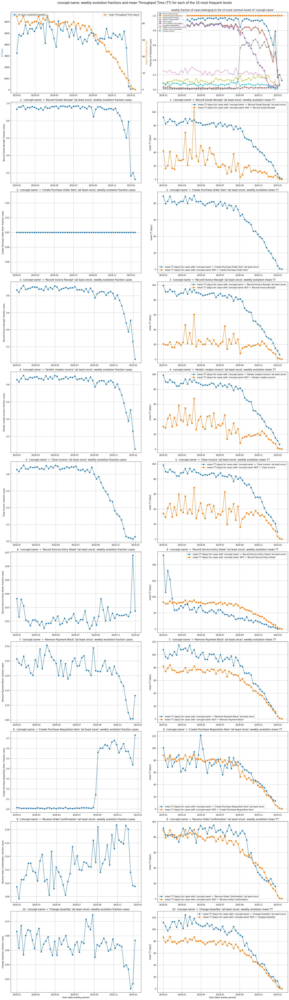

In [33]:
bpic19_plots.topK_categorical_eventftr_evol(event_feature='concept:name', plt_type = 'type_tt', xtr_outlier_rem = False)

#### __4.2.2 'concept:name'__ - Representation type: __Case Length (NEPC)__

Computing the weekly aggregations for each of the 10 most frequently occurring levels of categorical event feature 'concept:name': 100%|██████████| 10/10 [00:01<00:00,  9.82it/s]


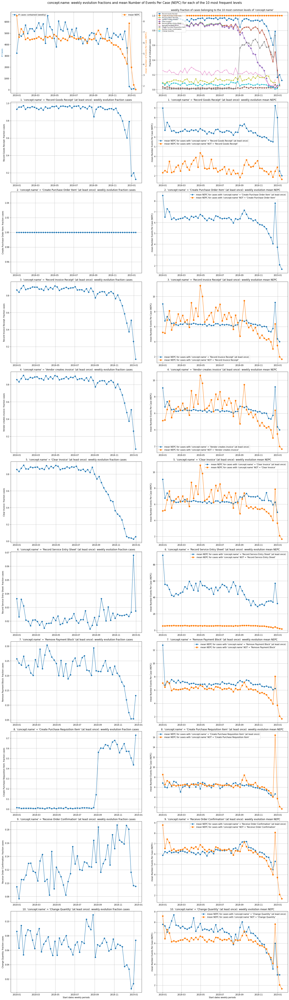

In [34]:
bpic19_plots.topK_categorical_eventftr_evol(event_feature='concept:name', plt_type = 'type_events_case', xtr_outlier_rem = False)

## __5. Numerical Event Features__ 
The BPIC19 event log contains only 1 numeric event feature, namely __'Cumulative net worth (EUR)'__. Because of the fact that __'Cumulative net worth (EUR)'__ is a cumulative measure, we decided to elevate each case's sequence of numeric event feature values to the case level by taking the last non-null value for each case (``numEventFt_transform='last'``).

The weekly mean value of __'Cumulative net worth (EUR)'__ remains relatively stable over time, with some outliers at both the beginning and end of the event log. Also the ratio of mean NEPC per 10^(x) units of the numeric feature remains relatively stable over time. However, the ratio of TT per unit of numeric feature gradually declines over time, but this is mostly due to the overall mean throughput time declining over time. 

### __5.1 Numerical Event Features__ - Representation type: __Throughput Time (TT)__

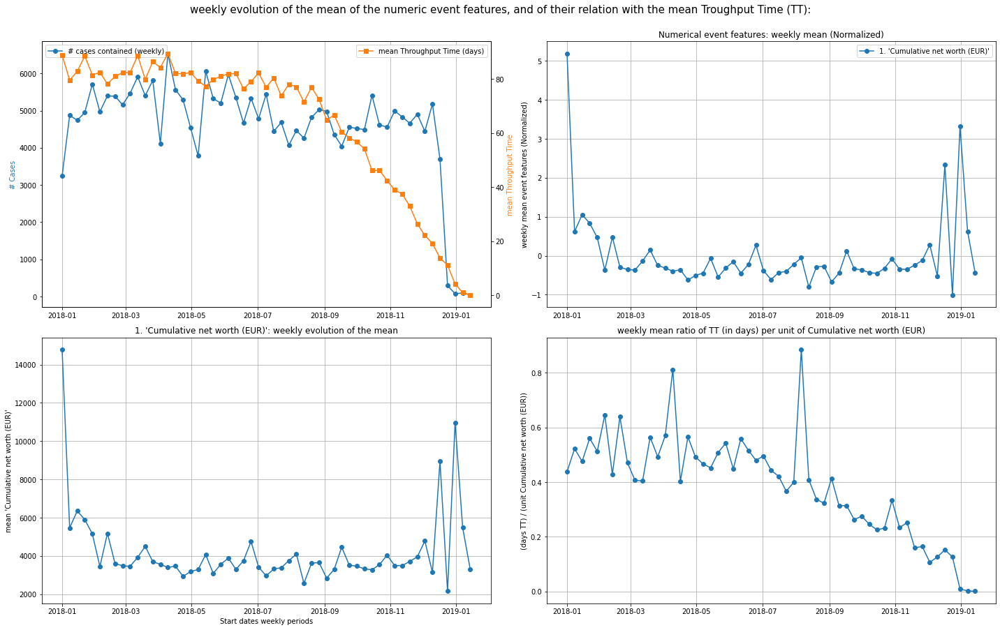

In [45]:
bpic19_plots.num_eventfts_evol(numeric_event_list= numeric_eventfeatures, plt_type = 'type_tt', 
                               numEventFt_transform='last', xtr_outlier_rem = False)

### __5.2 Numerical Event Features__ - Representation type: __Case Length (NEPC)__

Computing the additional weekly NEPC aggregations for each of the 1 given numerical event features: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


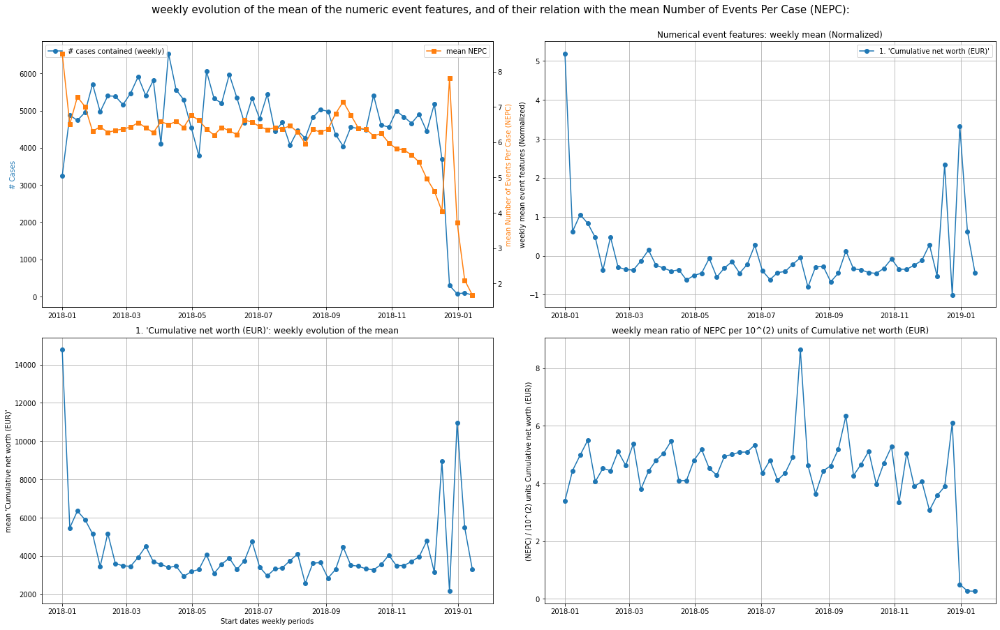

In [44]:
bpic19_plots.num_eventfts_evol(numeric_event_list= numeric_eventfeatures, plt_type = 'type_events_case', numEventFt_transform='last', xtr_outlier_rem=False)